<a href="https://colab.research.google.com/github/jithesh9539/GMM_Birch_Kmeans_Clustering/blob/main/Machine_Learing_GMM_KMeans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [37]:
# importing the necessary packages
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set()

# allowing all the columns to be visualized
pd.options.display.max_columns = None

# rendering all graphics straight out of the notebook
%matplotlib inline

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [38]:
data=pd.read_csv('SpotifyFeatures.csv')

In [39]:
data.head()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232725 non-null  object 
 3   track_id          232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

In [41]:
data.describe()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
count,232725.000000,232725.000000,232725.000000,2.327250e+05,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000,232725.000000
mean,41.127502,0.368560,0.554364,2.351223e+05,0.570958,0.148301,0.215009,-9.569885,0.120765,117.666585,0.454917
std,18.189948,0.354768,0.185608,1.189359e+05,0.263456,0.302768,0.198273,5.998204,0.185518,30.898907,0.260065
min,0.000000,0.000000,0.056900,1.538700e+04,0.000020,0.000000,0.009670,-52.457000,0.022200,30.379000,0.000000
25%,29.000000,0.037600,0.435000,1.828570e+05,0.385000,0.000000,0.097400,-11.771000,0.036700,92.959000,0.237000
50%,43.000000,0.232000,0.571000,2.204270e+05,0.605000,0.000044,0.128000,-7.762000,0.050100,115.778000,0.444000
75%,55.000000,0.722000,0.692000,2.657680e+05,0.787000,0.035800,0.264000,-5.501000,0.105000,139.054000,0.660000
max,100.000000,0.996000,0.989000,5.552917e+06,0.999000,0.999000,1.000000,3.744000,0.967000,242.903000,1.000000


In [42]:
data.shape

(232725, 18)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fceecff7d90>,
      dtype=object)

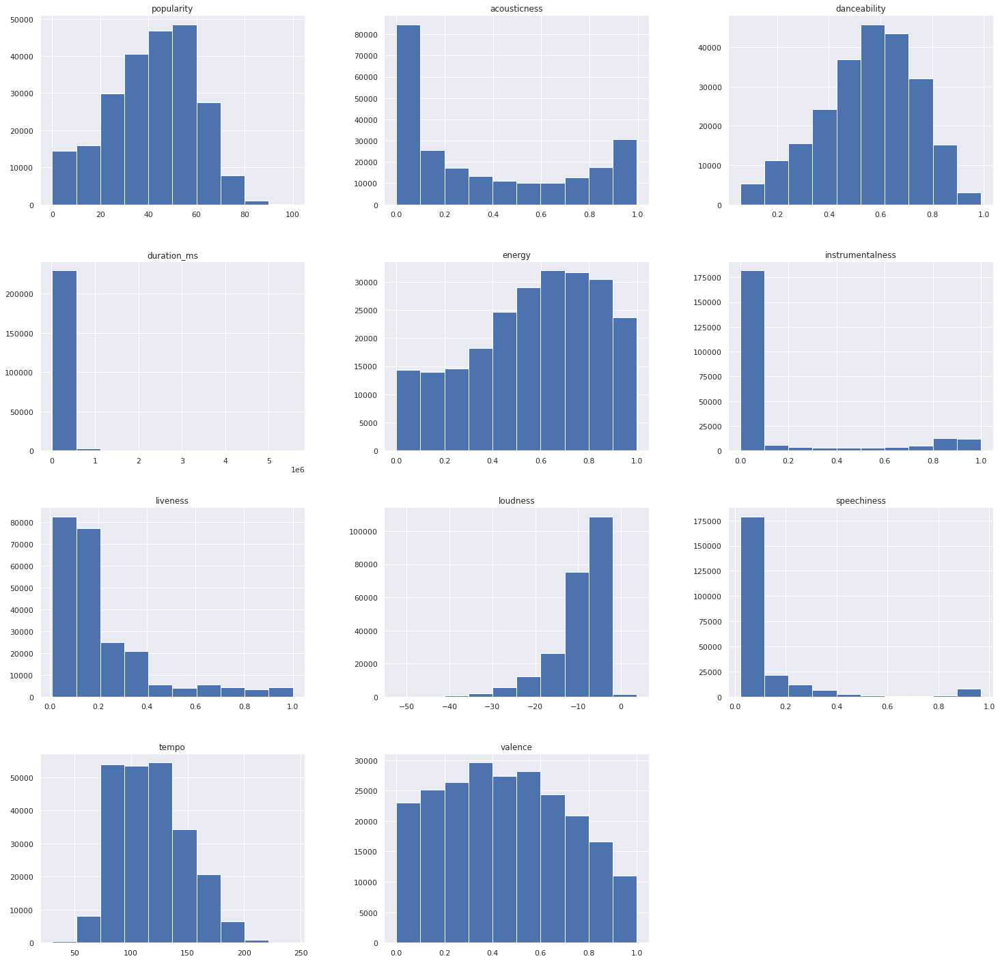

In [43]:
data.hist(figsize=(25,25))

In [44]:
#creating a new dataset with the top 500 songs
data_new = data.copy()
data_new = data_new.sort_values(by = 'popularity', ascending = False)
data_new = data_new.iloc[:500]
data_new.head(10)

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
9027,Dance,Ariana Grande,7 rings,14msK75pk3pA33pzPVNtBF,100,0.5780,0.725,178640,0.321,0.000000,C#,0.0884,-10.744,Minor,0.3230,70.142,4/4,0.319
107804,Pop,Ariana Grande,7 rings,14msK75pk3pA33pzPVNtBF,100,0.5780,0.725,178640,0.321,0.000000,C#,0.0884,-10.744,Minor,0.3230,70.142,4/4,0.319
86951,Rap,Post Malone,Wow.,6MWtB6iiXyIwun0YzU6DFP,99,0.1630,0.833,149520,0.539,0.000002,B,0.1010,-7.399,Minor,0.1780,99.947,4/4,0.385
107803,Pop,Post Malone,Wow.,6MWtB6iiXyIwun0YzU6DFP,99,0.1630,0.833,149520,0.539,0.000002,B,0.1010,-7.399,Minor,0.1780,99.947,4/4,0.385
107802,Pop,Ariana Grande,"break up with your girlfriend, i'm bored",4kV4N9D1iKVxx1KLvtTpjS,99,0.0421,0.726,190440,0.554,0.000000,F,0.1060,-5.290,Minor,0.0917,169.999,4/4,0.335
9026,Dance,Ariana Grande,"break up with your girlfriend, i'm bored",4kV4N9D1iKVxx1KLvtTpjS,99,0.0421,0.726,190440,0.554,0.000000,F,0.1060,-5.290,Minor,0.0917,169.999,4/4,0.335
66643,Hip-Hop,Daddy Yankee,Con Calma,5w9c2J52mkdntKOmRLeM2m,98,0.1100,0.737,193227,0.860,0.000002,G#,0.0574,-2.652,Minor,0.0593,93.989,4/4,0.656
107909,Pop,Daddy Yankee,Con Calma,5w9c2J52mkdntKOmRLeM2m,98,0.1100,0.737,193227,0.860,0.000002,G#,0.0574,-2.652,Minor,0.0593,93.989,4/4,0.656
138918,Reggaeton,Daddy Yankee,Con Calma,5w9c2J52mkdntKOmRLeM2m,98,0.1100,0.737,193227,0.860,0.000002,G#,0.0574,-2.652,Minor,0.0593,93.989,4/4,0.656
107829,Pop,Ava Max,Sweet but Psycho,25sgk305KZfyuqVBQIahim,97,0.0691,0.719,187436,0.704,0.000000,C#,0.1660,-4.724,Major,0.0476,133.002,4/4,0.628


In [45]:
n = 10
print("Most Famous Artists")
data_new['artist_name'].value_counts()[:n]

Most Famous Artists


Ariana Grande    34
Post Malone      16
XXXTENTACION     14
Lil Baby         11
Offset            9
Drake             9
Travis Scott      8
Billie Eilish     8
Dua Lipa          8
Shawn Mendes      8
Name: artist_name, dtype: int64

In [46]:
# top songs from the top artist
data_new.loc[data_new['artist_name'] == 'Ariana Grande']

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
9027,Dance,Ariana Grande,7 rings,14msK75pk3pA33pzPVNtBF,100,0.5780,0.725,178640,0.321,0.000000,C#,0.0884,-10.744,Minor,0.3230,70.142,4/4,0.319
107804,Pop,Ariana Grande,7 rings,14msK75pk3pA33pzPVNtBF,100,0.5780,0.725,178640,0.321,0.000000,C#,0.0884,-10.744,Minor,0.3230,70.142,4/4,0.319
107802,Pop,Ariana Grande,"break up with your girlfriend, i'm bored",4kV4N9D1iKVxx1KLvtTpjS,99,0.0421,0.726,190440,0.554,0.000000,F,0.1060,-5.290,Minor,0.0917,169.999,4/4,0.335
9026,Dance,Ariana Grande,"break up with your girlfriend, i'm bored",4kV4N9D1iKVxx1KLvtTpjS,99,0.0421,0.726,190440,0.554,0.000000,F,0.1060,-5.290,Minor,0.0917,169.999,4/4,0.335
107814,Pop,Ariana Grande,"thank u, next",2rPE9A1vEgShuZxxzR2tZH,95,0.2800,0.724,207333,0.647,0.000000,C#,0.1020,-5.642,Major,0.0658,106.960,4/4,0.435
9031,Dance,Ariana Grande,"thank u, next",2rPE9A1vEgShuZxxzR2tZH,95,0.2800,0.724,207333,0.647,0.000000,C#,0.1020,-5.642,Major,0.0658,106.960,4/4,0.435
107811,Pop,Ariana Grande,needy,1TEL6MlSSVLSdhOSddidlJ,92,0.7800,0.647,171573,0.309,0.000007,G,0.2020,-7.948,Minor,0.0366,87.045,4/4,0.195
9029,Dance,Ariana Grande,needy,1TEL6MlSSVLSdhOSddidlJ,92,0.7800,0.647,171573,0.309,0.000007,G,0.2020,-7.948,Minor,0.0366,87.045,4/4,0.195
107817,Pop,Ariana Grande,bloodline,2hloaUoRonYssMuqLCBLTX,91,0.0815,0.758,216893,0.665,0.000157,D,0.2160,-5.188,Minor,0.0774,151.976,4/4,0.643
9033,Dance,Ariana Grande,bad idea,5Il6Oe7lr5XM7A0cWbVQtr,91,0.0268,0.847,267107,0.579,0.054500,C#,0.1020,-5.314,Major,0.0719,137.998,4/4,0.569


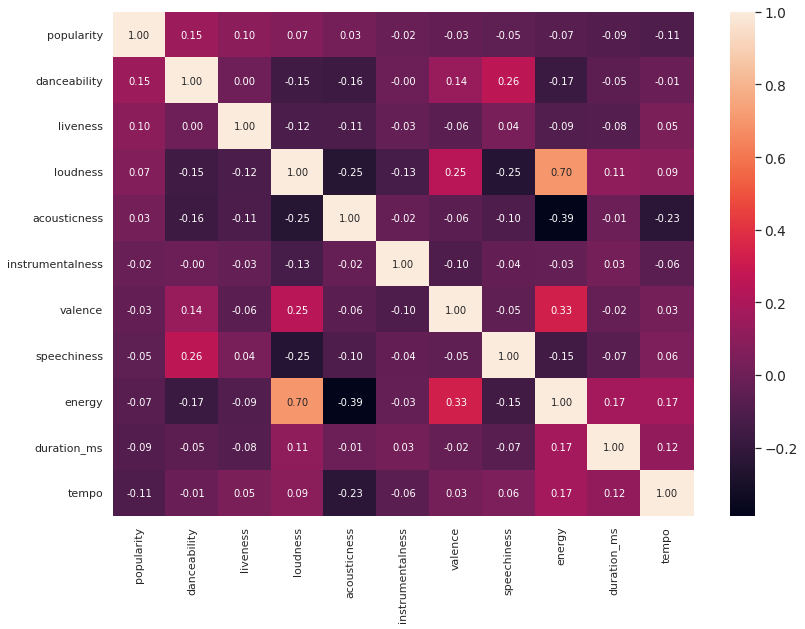

In [47]:
# creating a correlation matrix
corr = data_new.corr()

# focused heatmap - Popularity
# number of variables to be selected
k = 12

# finding the most correlated variables
cols = corr.nlargest(k, 'popularity')['popularity'].index
cm = np.corrcoef(data_new[cols].values.T)

#plotting the heatmap
f, ax = plt.subplots(figsize=(12,9))
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.tight_layout()


In [48]:
df_cluster = data.copy()
df_X = df_cluster.select_dtypes(np.number)
cols = df_X.columns
cols

Index(['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence'],
      dtype='object')

In [49]:
df_X.shape

(232725, 11)

In [50]:
df_X.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,0,0.611,0.389,99373,0.910,0.000,0.3460,-1.828,0.0525,166.969,0.814
1,1,0.246,0.590,137373,0.737,0.000,0.1510,-5.559,0.0868,174.003,0.816
2,3,0.952,0.663,170267,0.131,0.000,0.1030,-13.879,0.0362,99.488,0.368
3,0,0.703,0.240,152427,0.326,0.000,0.0985,-12.178,0.0395,171.758,0.227
4,4,0.950,0.331,82625,0.225,0.123,0.2020,-21.150,0.0456,140.576,0.390


In [51]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [52]:
scaled = pd.DataFrame(scaler.fit_transform(df_X))
scaled.columns = cols

In [53]:
scaled.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,0.00,0.613454,0.356292,0.015167,0.910909,0.000000,0.339614,0.900856,0.032070,0.642704,0.814
1,0.01,0.246988,0.571934,0.022029,0.737732,0.000000,0.142710,0.834469,0.068374,0.675801,0.816
2,0.03,0.955823,0.650252,0.027969,0.131113,0.000000,0.094241,0.686429,0.014818,0.325182,0.368
3,0.00,0.705823,0.196438,0.024747,0.326313,0.000000,0.089697,0.716695,0.018311,0.665238,0.227
4,0.04,0.953815,0.294067,0.012142,0.225209,0.123123,0.194208,0.557054,0.024767,0.518516,0.390


In [54]:
#from sklearn.decomposition import PCA
#pca = PCA(n_components=2)

#pca.fit(scaled)

#pca_df = pca.transform(scaled)

In [55]:
from sklearn.cluster import KMeans

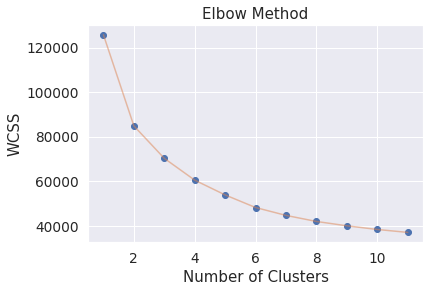

In [56]:
# finding out the proper number of clusters
# Within-Cluster Sum of Square
wcss = []
for i in range(1,12):
  kmeans_sk = KMeans(n_clusters = i, init = 'k-means++', max_iter = 500, n_init = 10, random_state = 0)
  kmeans_sk.fit(scaled)
  wcss.append(kmeans_sk.inertia_)
plt.plot(range(1,12), wcss, 'o')
plt.plot(range(1 , 12) , wcss , '-' , alpha = 0.5)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.savefig('Elbow_Method.png')
plt.show()

In [57]:
# instantiating model
kmeans_sk = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 500, n_init = 10, random_state = 0)
y_kmeans = kmeans_sk.fit_predict(scaled)

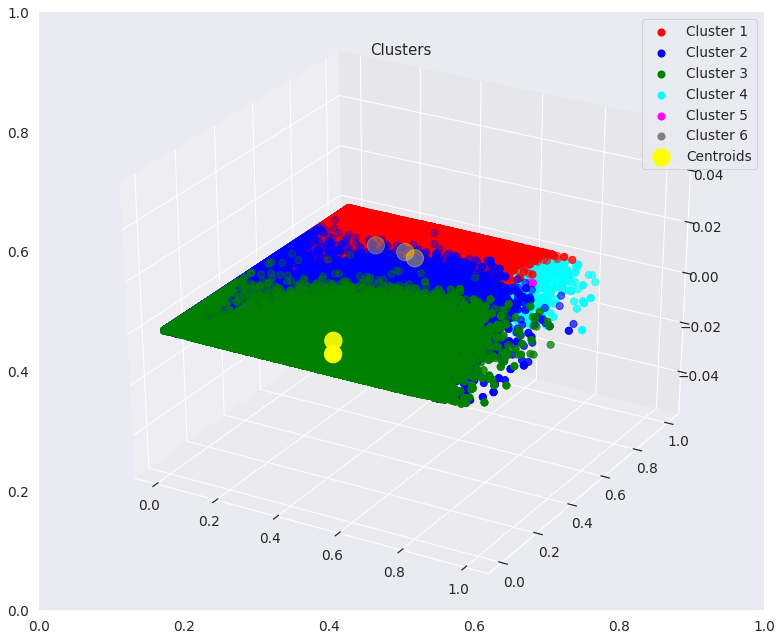

In [58]:
  from mpl_toolkits.mplot3d import Axes3D
# visualizing clusters
fig, ax = plt.subplots(figsize=(13,11))
ax = fig.add_subplot(111, projection='3d')

scaled1=np.array(scaled)

plt.scatter(scaled1[y_kmeans == 0,0],scaled1[y_kmeans == 0,1], s= 50, c= 'red',label= 'Cluster 1')
plt.scatter(scaled1[y_kmeans == 1,0], scaled1[y_kmeans == 1,1], s= 50, c= 'blue', label= 'Cluster 2')
plt.scatter(scaled1[y_kmeans == 2,0], scaled1[y_kmeans == 2,1], s= 50, c= 'green', label= 'Cluster 3')
plt.scatter(scaled1[y_kmeans == 3,0], scaled1[y_kmeans == 3,1], s= 50, c= 'cyan', label= 'Cluster 4')
plt.scatter(scaled1[y_kmeans == 4,0], scaled1[y_kmeans == 4,1], s= 50, c= 'magenta', label= 'Cluster 5')
plt.scatter(scaled1[y_kmeans == 5,0], scaled1[y_kmeans == 5,1], s= 50, c= 'gray', label= 'Cluster 6')
# centroids
plt.scatter(kmeans_sk.cluster_centers_[:, 0], kmeans_sk.cluster_centers_[:,1], s= 300, c= 'yellow', label= 'Centroids')
plt.title('Clusters')
plt.legend()
plt.savefig('clusters.png')
plt.show()

In [59]:
# predictions 
y_kmeans

array([1, 1, 3, ..., 3, 1, 1], dtype=int32)

In [60]:
# converting preditcions into a df
kmeans_sk = pd.DataFrame(data=y_kmeans, dtype=int)
kmeans_sk.columns = ['k_cluster']

# predictions as a df
print(kmeans_sk.shape)
kmeans_sk

(232725, 1)


,k_cluster
0,1
1,1
2,3
3,3
4,3
...,...
232720,1
232721,1
232722,3
232723,1


In [61]:
# concatenating the cluster column to the dataframe
df_skcluster = pd.concat([df_cluster, kmeans_sk], axis=1)

# checking the dataframe
print(df_skcluster.shape)
df_skcluster.head()

(232725, 19)


,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,k_cluster
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814,1
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816,1
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368,3
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227,3
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390,3


In [62]:
# popularity mean by cluster
df_skcluster.groupby(['k_cluster']).popularity.mean().sort_values(ascending=False)

k_cluster
2    48.399415
1    44.017115
3    35.251936
0    30.596900
4    20.817955
Name: popularity, dtype: float64

In [63]:
# checking number of songs in each cluster
df_skcluster['k_cluster'].value_counts()

1    75140
2    74817
3    44801
0    27931
4    10036
Name: k_cluster, dtype: int64

In [64]:
# checking the songs in the cluster
df_skcluster.loc[df_skcluster['k_cluster'] == 1][:10]

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,k_cluster
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.61100,0.389,99373,0.910,0.000000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814,1
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.24600,0.590,137373,0.737,0.000000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816,1
8,Movie,Chorus,Helka,0ST6uPfvaPpJLtQwhE6KfC,0,0.00104,0.734,226200,0.481,0.000860,C,0.0765,-7.725,Major,0.0460,125.080,4/4,0.765,1
9,Movie,Le Club des Juniors,Les bisous des bisounours,0VSqZ3KStsjcfERGdcWpFO,10,0.31900,0.598,152694,0.705,0.001250,G,0.3490,-7.790,Major,0.0281,137.496,4/4,0.718,1
17,Movie,Bernard Minet,Ultra Man 80,0x8xSaoSfQkOYUnG1nbga0,3,0.48800,0.744,178107,0.953,0.000000,E,0.4530,-4.986,Major,0.0370,129.959,4/4,0.926,1
19,Movie,Amalya,Ladies And Gentlemen,12ZjoNweObu1k9rK4SOSdL,4,0.16100,0.522,207240,0.748,0.000007,C#,0.1110,-5.203,Major,0.0824,184.063,4/4,0.733,1
21,Movie,Dorothée,Clic clac cloc,148uA2Y78xfxDiCNjgZA0v,1,0.51300,0.855,183467,0.504,0.000000,D,0.0778,-12.359,Major,0.0737,128.052,4/4,0.682,1
22,Movie,Henri Salvador,Monsieur Boum Boum,14K25Ks5fdHjHfpIYOTc4y,8,0.68900,0.704,161773,0.804,0.042200,C,0.1800,-6.699,Major,0.1090,127.999,4/4,0.836,1
23,Movie,Jean Claude Corbel,Pourquoi aller plus loin ?,15CpJP0LXchBUjpB8RKh8m,0,0.66900,0.707,71299,0.696,0.000000,C,0.1970,-10.472,Major,0.0280,114.752,4/4,0.833,1
26,Movie,Henri Salvador,Le Fêtard,16hVzfu0IJZmP3Bj4x1BB1,0,0.15900,0.636,152840,0.594,0.000000,G#,0.1840,-7.943,Major,0.0840,111.361,4/4,0.669,1


In [65]:
# statistical distribution of the data in each column, for each cluster
df_skcluster.groupby("k_cluster").describe() 

popularity                                                      \
               count       mean        std  min   25%   50%   75%    max   
k_cluster                                                                  
0            27931.0  30.596900  14.063450  0.0  24.0  32.0  39.0   75.0   
1            75140.0  44.017115  17.196967  0.0  32.0  46.0  56.0   98.0   
2            74817.0  48.399415  14.671477  0.0  39.0  50.0  59.0   99.0   
3            44801.0  35.251936  20.464682  0.0  18.0  39.0  51.0  100.0   
4            10036.0  20.817955  10.096517  0.0  14.0  19.0  26.0   73.0   

          acousticness                                                        \
                 count      mean       std       min      25%     50%    75%   
k_cluster                                                                      
0              27931.0  0.798492  0.249913  0.000001  0.71500  0.9140  0.975   
1              75140.0  0.175775  0.179762  0.000001  0.02630  0.1140  0.279   
2              74817.0  0.101036  0.124775  0.000000  0.00598  0.0445  0.159   
3              44801.0  0.774366  0.168873  0.099500  0.64800  0.8030  0.926   
4              10036.0  0.798248  0.116018  0.013900  0.75200  0.8200  0.874   

                 danceability                                            \
             max        count      mean       std     min    25%    50%   
k_cluster                                                                 
0          0.996      27931.0  0.340972  0.189045  0.0569  0.183  0.310   
1          0.961      75140.0  0.675810  0.128574  0.1610  0.592  0.685   
2          0.741      74817.0  0.547935  0.155453  0.0617  0.442  0.545   
3          0.996      44801.0  0.492853  0.172446  0.0611  0.367  0.498   
4          0.995      10036.0  0.561504  0.091314  0.1750  0.501  0.563   

                        duration_ms                                         \
             75%    max       count           mean            std      min   
k_cluster                                                                    
0          0.470  0.979     27931.0  252988.631592  180985.511448  19533.0   
1          0.769  0.989     75140.0  223554.501690   74298.015350  21667.0   
2          0.656  0.980     74817.0  242889.739952   82356.264296  17853.0   
3          0.620  0.980     44801.0  228393.213991  120864.403437  15509.0   
4          0.624  0.930     10036.0  244142.052112  277756.111882  15387.0   

                                                       energy            \
                 25%       50%        75%        max    count      mean   
k_cluster                                                                 
0          141227.00  215831.0  311219.00  4804015.0  27931.0  0.220160   
1          186193.00  216218.5  250823.25  5488000.0  75140.0  0.716705   
2          198787.00  230227.0  270847.00  4830606.0  74817.0  0.697936   
3          169400.00  214267.0  265947.00  5552917.0  44801.0  0.311817   
4          121674.75  191053.5  287093.75  4791725.0  10036.0  0.666247   

                                                           instrumentalness  \
                std       min     25%    50%    75%    max            count   
k_cluster                                                                     
0          0.184903  0.000020  0.0693  0.169  0.332  0.991          27931.0   
1          0.158207  0.000267  0.6060  0.730  0.843  0.999          75140.0   
2          0.176122  0.018800  0.5640  0.699  0.845  0.999          74817.0   
3          0.162002  0.000216  0.1870  0.310  0.426  0.997          44801.0   
4          0.219101  0.001410  0.5060  0.695  0.855  0.998          10036.0   

                                                                       \
               mean       std    min    25%       50%      75%    max   
k_cluster                                                               
0          0.832916  0.134436  0.231  0.793  0.880000  0.92200  0.999   
1       

Conclusions
Most famous song are in cluster number 0.
Popularity Mean among clusters is very similar.

**Birch_Clustering**

In [66]:
from sklearn.cluster import Birch

In [67]:
brc = Birch(n_clusters=6)
brc.fit(scaled)

Birch(n_clusters=6)

In [68]:
dataBirch = data.copy()
dataBirch['cluster_label'] = brc.predict(scaled)
dataBirch

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,cluster_label
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.61100,0.389,99373,0.910,0.000000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814,5
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.24600,0.590,137373,0.737,0.000000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816,3
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.95200,0.663,170267,0.131,0.000000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368,0
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.70300,0.240,152427,0.326,0.000000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227,0
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.95000,0.331,82625,0.225,0.123000,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232720,Soul,Slave,Son Of Slide,2XGLdVl7lGeq8ksM6Al7jT,39,0.00384,0.687,326240,0.714,0.544000,D,0.0845,-10.626,Major,0.0316,115.542,4/4,0.962,4
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,1qWZdkBl4UVPj9lK6HuuFM,38,0.03290,0.785,282447,0.683,0.000880,E,0.2370,-6.944,Minor,0.0337,113.830,4/4,0.969,3
232722,Soul,Muddy Waters,(I'm Your) Hoochie Coochie Man,2ziWXUmQLrXTiYjCg2fZ2t,47,0.90100,0.517,166960,0.419,0.000000,D,0.0945,-8.282,Major,0.1480,84.135,4/4,0.813,0
232723,Soul,R.LUM.R,With My Words,6EFsue2YbIG4Qkq8Zr9Rir,44,0.26200,0.745,222442,0.704,0.000000,A,0.3330,-7.137,Major,0.1460,100.031,4/4,0.489,3


**GMM_Clustering**

In [69]:
# training gaussian mixture model 
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=6, random_state = 0)
y_cluster = scaled.copy()
gmm.fit(y_cluster)
y_cluster["gmm_cluster"] = gmm.predict(y_cluster)

In [70]:
y_cluster

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,gmm_cluster
0,0.00,0.613454,0.356292,0.015167,0.910909,0.000000,0.339614,0.900856,0.032070,0.642704,0.814,4
1,0.01,0.246988,0.571934,0.022029,0.737732,0.000000,0.142710,0.834469,0.068374,0.675801,0.816,2
2,0.03,0.955823,0.650252,0.027969,0.131113,0.000000,0.094241,0.686429,0.014818,0.325182,0.368,3
3,0.00,0.705823,0.196438,0.024747,0.326313,0.000000,0.089697,0.716695,0.018311,0.665238,0.227,3
4,0.04,0.953815,0.294067,0.012142,0.225209,0.123123,0.194208,0.557054,0.024767,0.518516,0.390,0
...,...,...,...,...,...,...,...,...,...,...,...,...
232720,0.39,0.003855,0.676000,0.056136,0.714709,0.544545,0.075561,0.744311,0.009949,0.400722,0.962,5
232721,0.38,0.033032,0.781139,0.048227,0.683677,0.000881,0.229550,0.809825,0.012172,0.392666,0.969,3
232722,0.47,0.904618,0.493617,0.027372,0.419408,0.000000,0.085658,0.786018,0.133150,0.252941,0.813,4
232723,0.44,0.263052,0.738226,0.037391,0.704699,0.000000,0.326487,0.806391,0.131033,0.327737,0.489,2


In [73]:
import plotly.express as px
fig = px.scatter_3d(y_cluster, x='danceability', y='loudness', z='popularity',
              color='gmm_cluster')
fig.show()